<a href="https://colab.research.google.com/github/nandaglhp/PCVK_Ganjil_2023/blob/main/Week7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im

In [3]:
def convolution2d(image, kernel, stride, padding):

  image = np.pad(image, padding, mode='constant', constant_values=0)

  kernel_height, kernel_width = kernel.shape
  padded_height, padded_width = image.shape

  output_height = (padded_height - kernel_height) // stride + 1
  output_width = (padded_width - kernel_width) // stride + 1

  new_image = np.zeros((output_height, output_width)).astype(np.float32)

  # convolution process
  for y in range(0, output_height):
    for x in range(0, output_width):
      new_image[y][x] = np.sum(image[y * stride:y * stride + kernel_height, x * stride:x * stride + kernel_width] * kernel).astype(np.float32)

  return new_image

In [4]:
path_female = '/content/drive/MyDrive/College/05 - Semester 5/PCVK/dataset/female.tiff'
img_m = cv.imread(path_female)
img_s = cv.resize(img_m, (0,0), fx=0.5, fy=0.5)
img_gray = cv.cvtColor(img_m, cv.COLOR_BGR2GRAY)

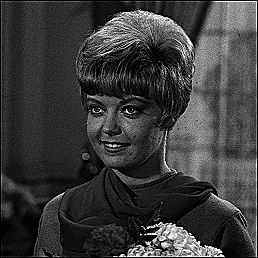

In [5]:
# SHARPEN

kernel_sharpen = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])
cv2_imshow(convolution2d(img_gray, kernel_sharpen, 1, 2))

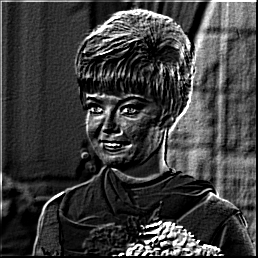

In [6]:
# EMBOS

kernel_embos = np.array([[-2, -1, 0],
                           [-1, 1, 1],
                           [0, 1, 2]])
cv2_imshow(convolution2d(img_gray, kernel_embos, 1, 2))

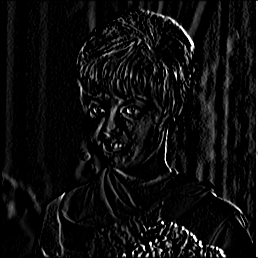

In [7]:
# Left Sobel Edge Detection

kernel_sobel = np.array([[1, 0, -1],
                           [2, 0, -2],
                           [1, 0, -1]])
cv2_imshow(convolution2d(img_gray, kernel_sobel, 1, 2))

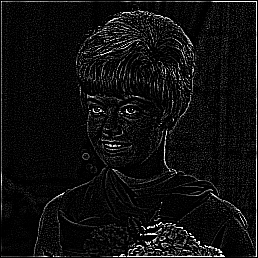

In [8]:
# Canny edge Detection

kernel_edge = np.array([[-1, -1, -1],
                           [-1, 8, -1],
                           [-1, -1, -1]])
cv2_imshow(convolution2d(img_gray, kernel_edge, 1, 2))

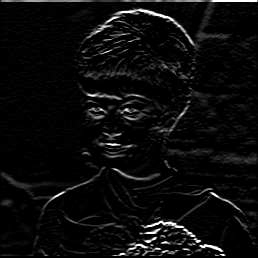

In [9]:
# Prewitt Edge Detection

kernel_edge = np.array([[-1, -1, -1],
                        [0, 0, 0],
                        [1, 1, 1]])
cv2_imshow(convolution2d(img_gray, kernel_edge, 1, 2))

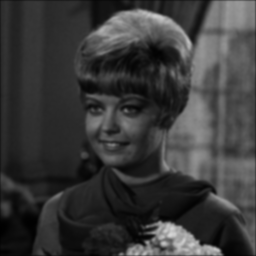

In [10]:
# 5x5 Gaussian Blur

kernel_edge = np.array([[1, 4, 6, 4, 1],
                        [4, 16, 24, 16, 4],
                        [6, 24, 36, 24, 6],
                        [4, 16, 24, 16, 4],
                        [1, 4, 6, 4, 1]])
kernel_edge = kernel_edge/256
cv2_imshow(convolution2d(img_gray, kernel_edge, 1, 2))

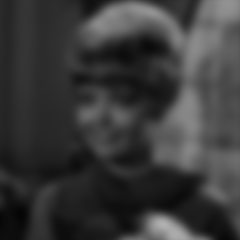

In [11]:
# 21x21 Gaussian Blur

kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

cv2_imshow(convolution2d(img_gray, gauss_kernel, 1, 2))

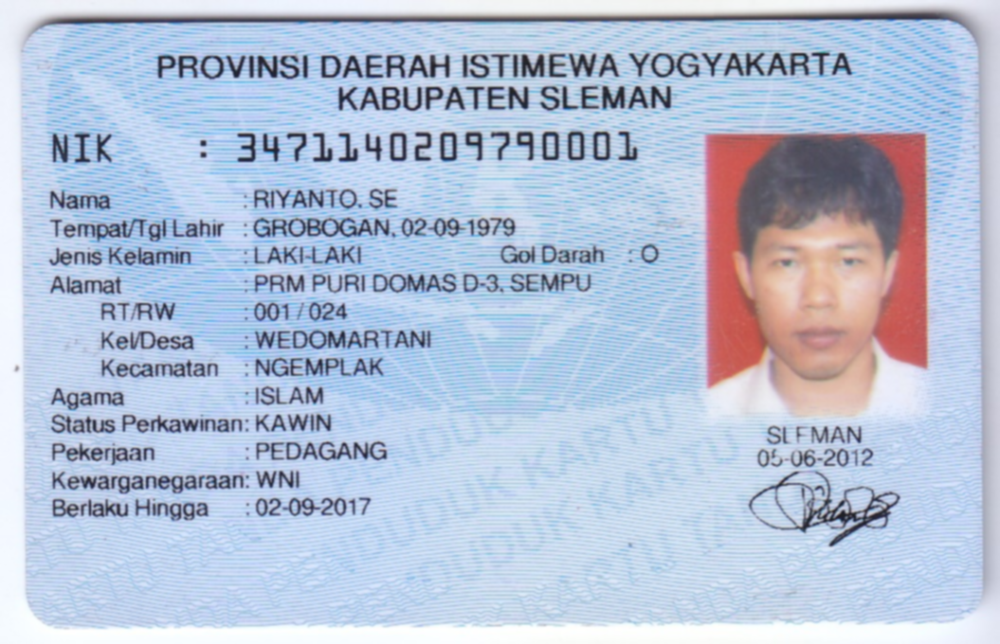

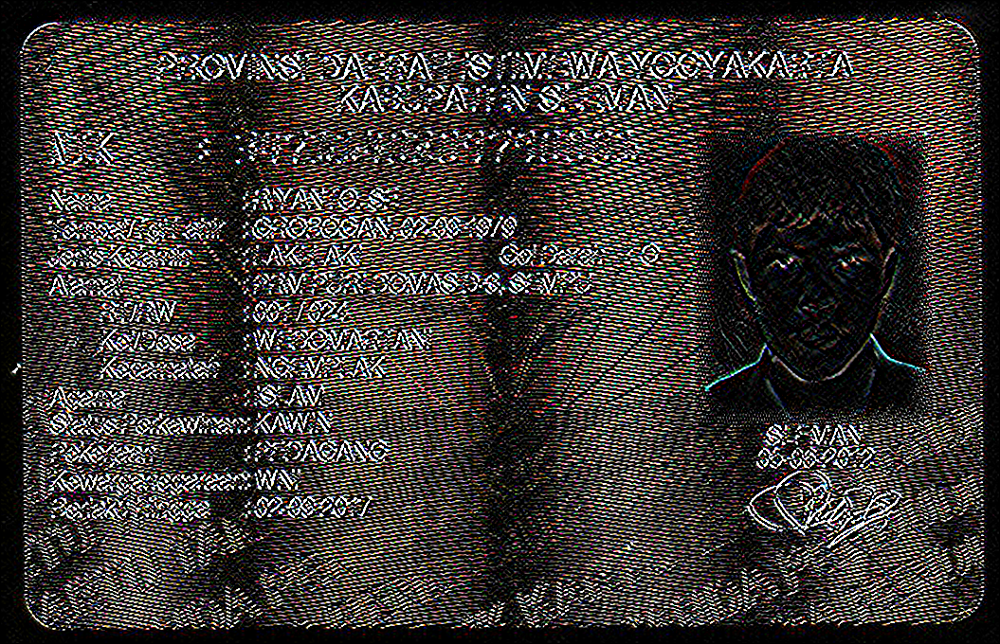

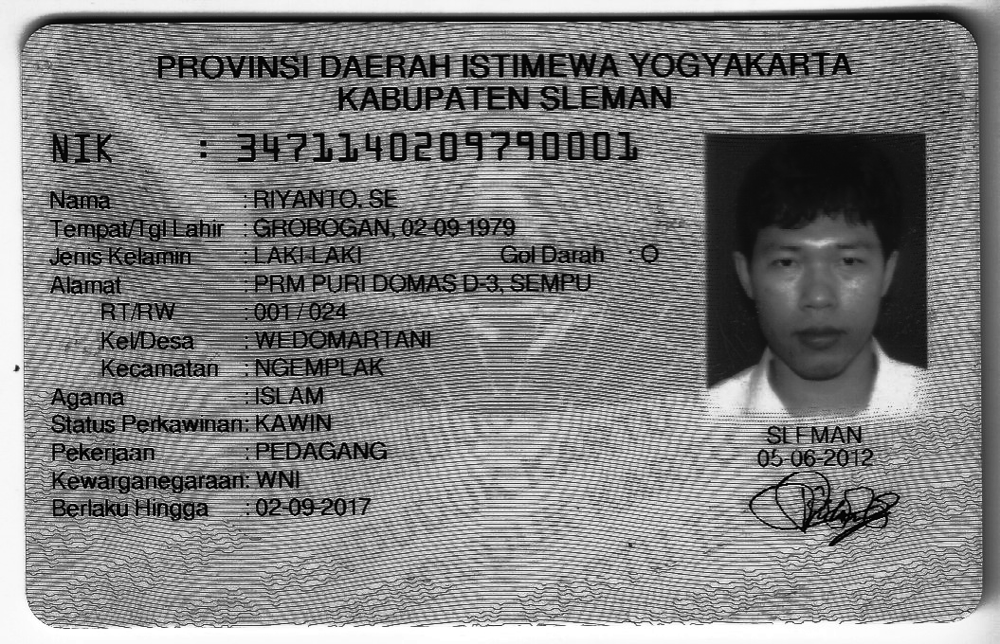

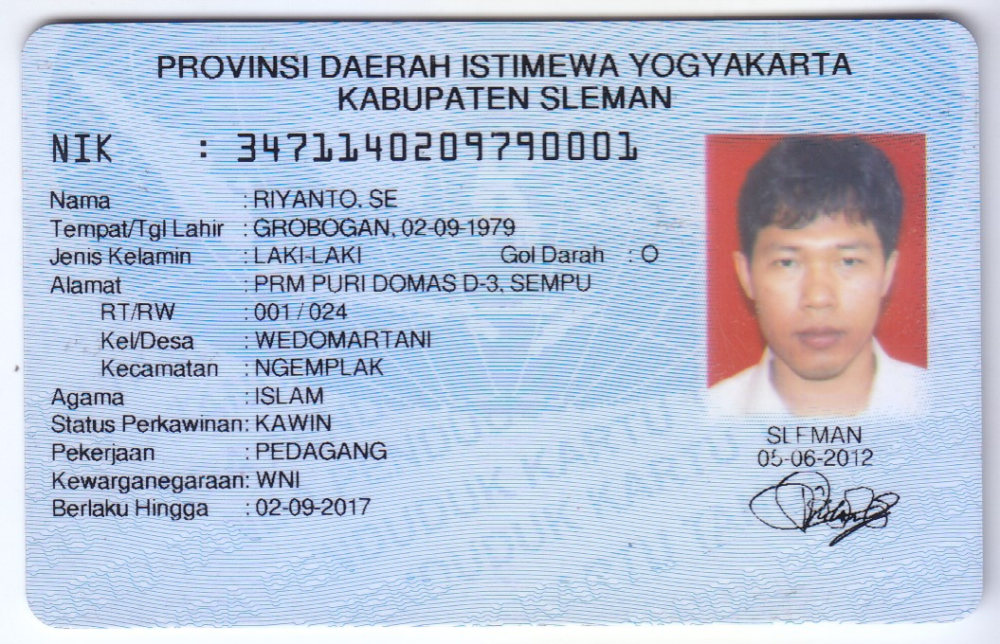

In [12]:
import cv2

# Baca citra KTP
path_ktp = '/content/drive/MyDrive/College/05 - Semester 5/PCVK/KTP_More/ktp.png'
ktp_image = cv2.imread(path_ktp)
# 1. Filterisasi -> menggunakan Gaussian Blur
filtered_image = cv2.GaussianBlur(ktp_image, (5, 5), 0)

# 2. Deteksi tepi -> menggunakan filter Sobel
edges = cv2.Sobel(ktp_image, cv2.CV_64F, 1, 1, ksize=5)

# 3. Histogram Equalization
gray_image = cv2.cvtColor(ktp_image, cv2.COLOR_BGR2GRAY)
equalized_image = cv2.equalizeHist(gray_image)

# 4. Operasi Aritmatika -> menambahkan citra hasil filterisasi dengan citra asli
combined_image = cv2.addWeighted(ktp_image, 0.7, filtered_image, 0.3, 0)

# 5. Tampilkan citra-citra hasil
cv2_imshow(filtered_image)
cv2_imshow(edges)
cv2_imshow(equalized_image)
cv2_imshow(combined_image)

## Citra Lain

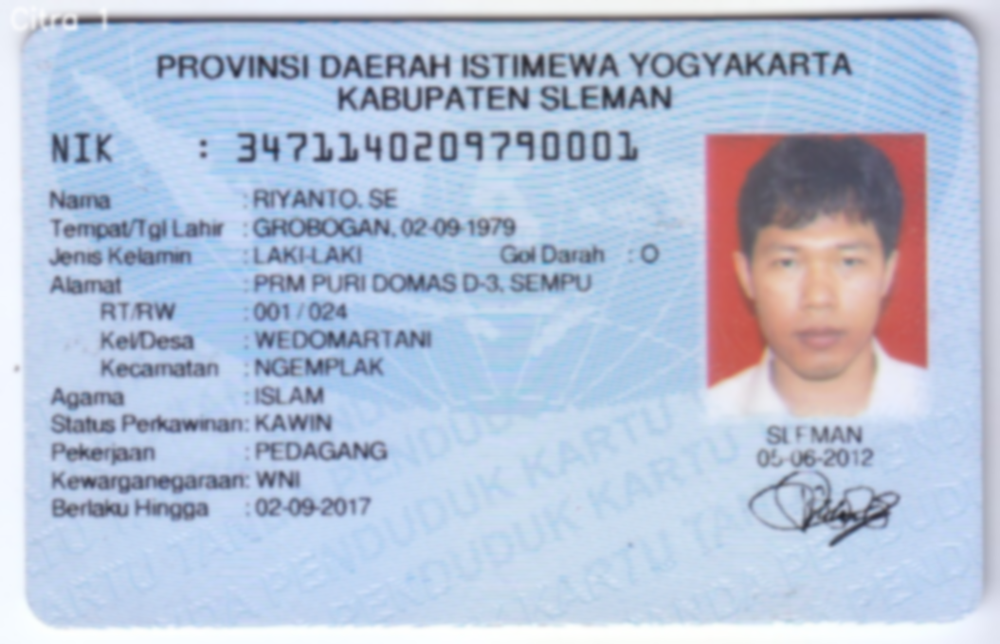

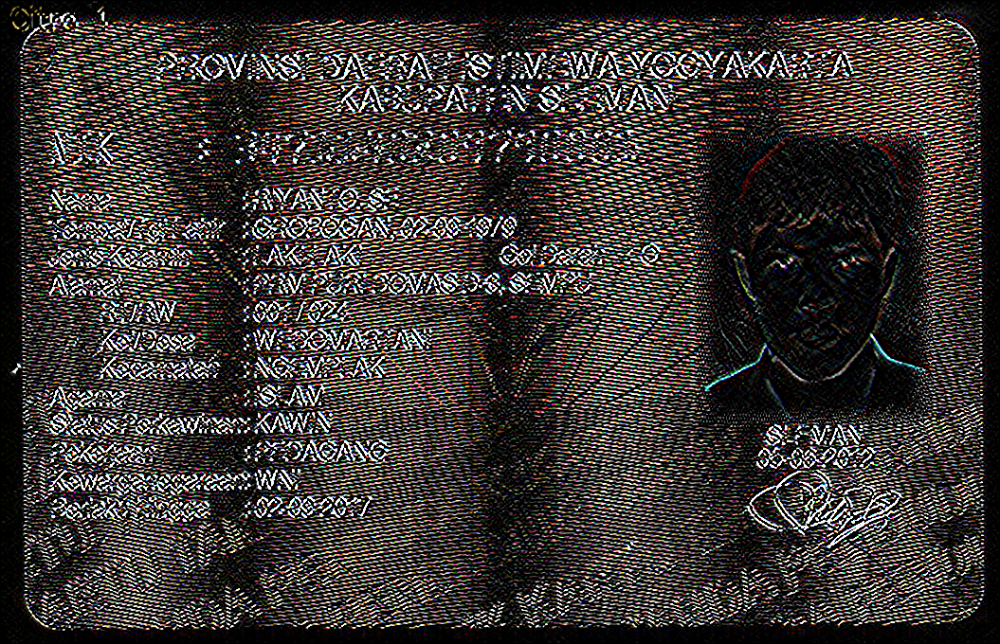

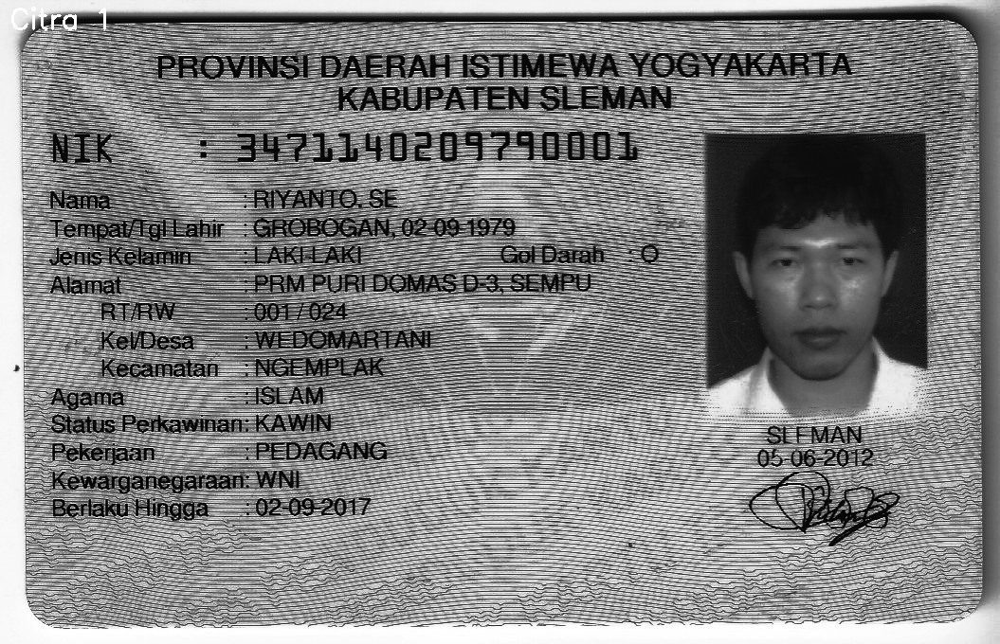

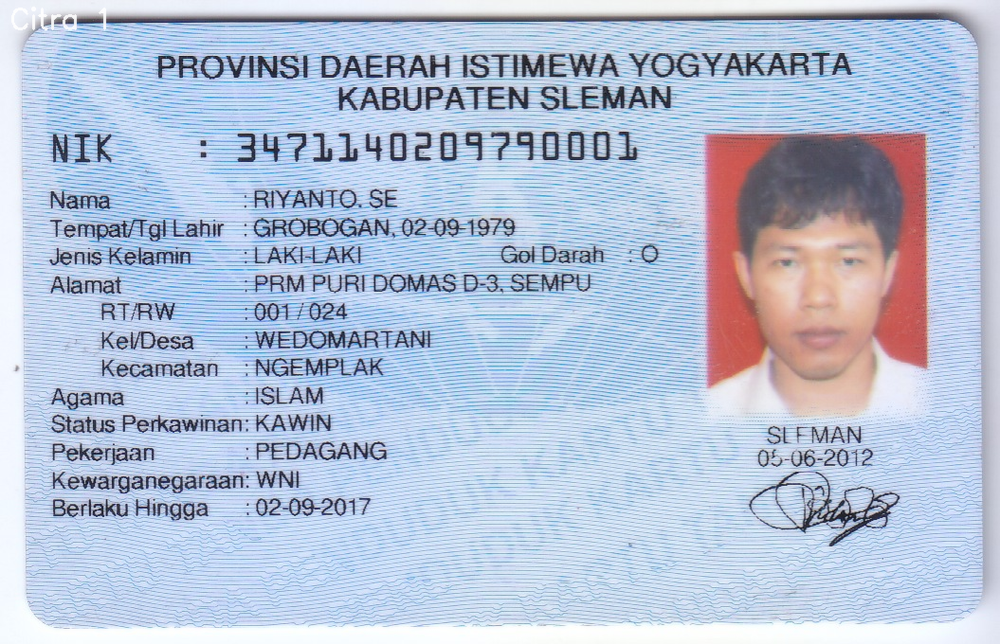

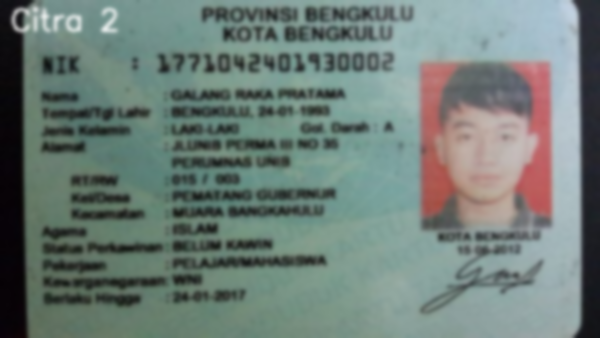

...

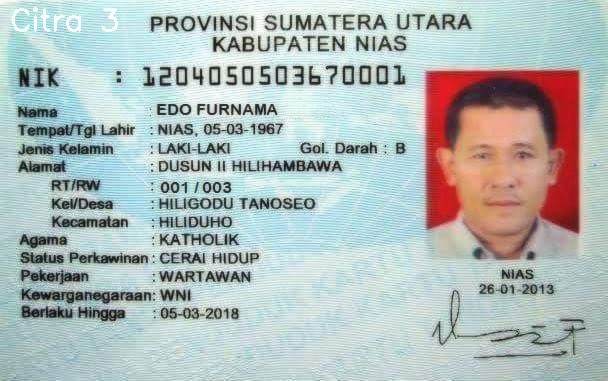

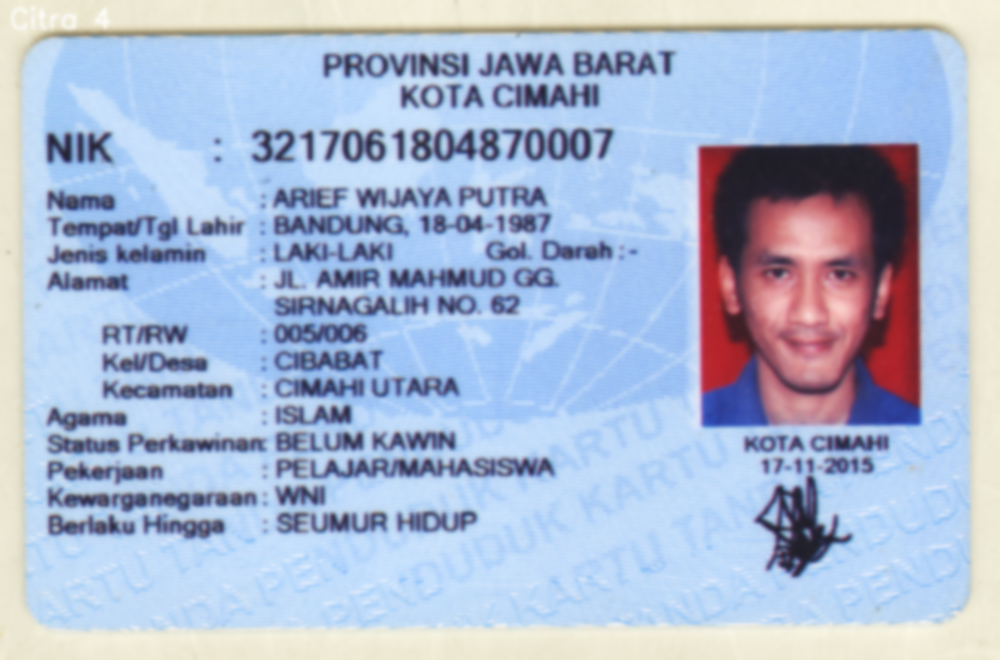

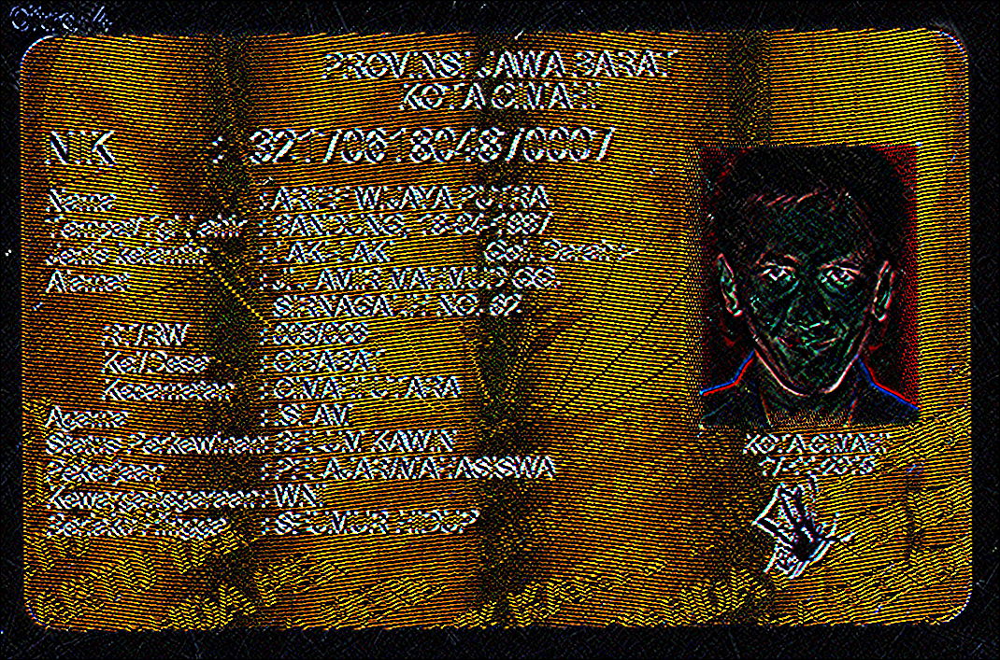

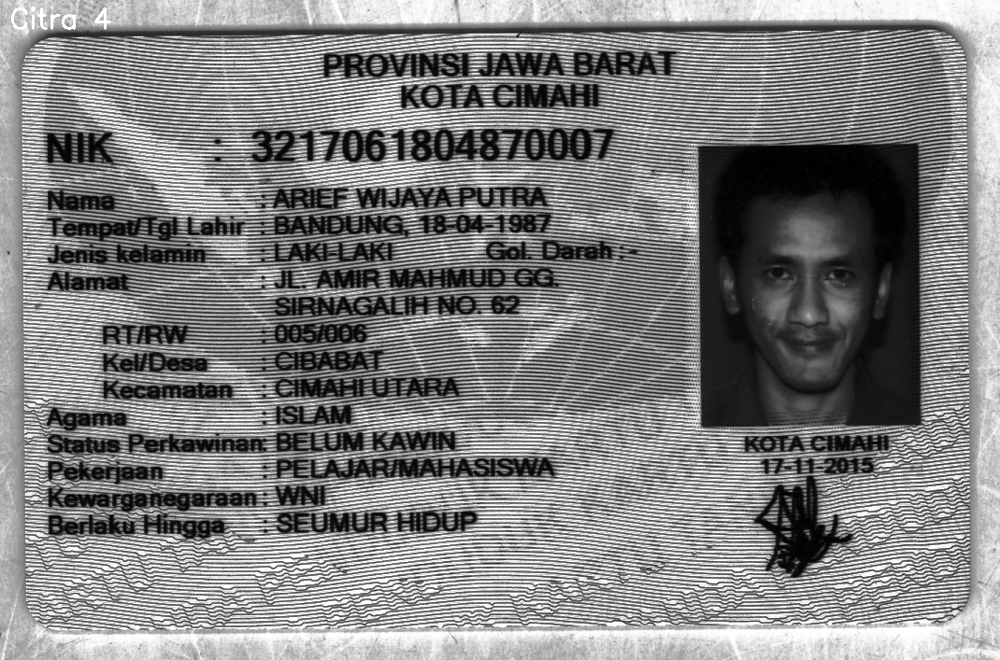

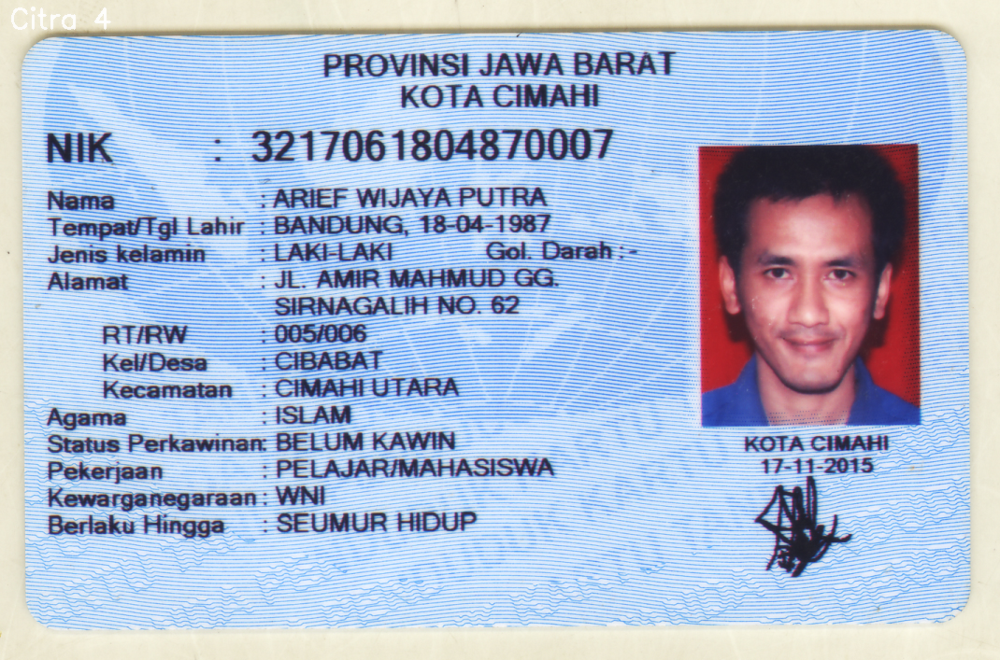

In [14]:
import cv2
import os

# Daftar nama file citra KTP
citra_list = [
    '/content/drive/MyDrive/College/05 - Semester 5/PCVK/KTP_More/ktp.png',
    '/content/drive/MyDrive/College/05 - Semester 5/PCVK/KTP_More/ktp1.png',
    '/content/drive/MyDrive/College/05 - Semester 5/PCVK/KTP_More/ktp5.png',
    '/content/drive/MyDrive/College/05 - Semester 5/PCVK/KTP_More/ktp2.png'
]

for i, nama_file in enumerate(citra_list):
    ktp_image = cv2.imread(nama_file)

    # Tambahkan keterangan pada setiap citra
    cv2.putText(ktp_image, f'Citra {i + 1}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # 1. Filterisasi -> menggunakan Gaussian Blur
    filtered_image = cv2.GaussianBlur(ktp_image, (11,11), 0)
    cv2_imshow(filtered_image)

    # 2. Deteksi tepi -> menggunakan filter Sobel
    edges = cv2.Sobel(ktp_image, cv2.CV_64F, 1, 1, ksize=5)
    cv2_imshow(edges)

    # 3. Histogram Equalization
    gray_image = cv2.cvtColor(ktp_image, cv2.COLOR_BGR2GRAY)
    equalized_image = cv2.equalizeHist(gray_image)
    cv2_imshow(equalized_image)

    # 4. Operasi Aritmatika -> misalnya, menambahkan citra hasil filterisasi dengan citra asli
    combined_image = cv2.addWeighted(ktp_image, 0.7, filtered_image, 0.3, 0)
    cv2_imshow(combined_image)